<a href="https://colab.research.google.com/github/AnnieNyasha/new/blob/main/sen2k150.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install tensorflow

In [2]:
import numpy as np           #fr numerical computations
import pandas as pd          #fr organising and analysing tabular data

import tensorflow as tf                                                      #fr building and training models
print (tf.__version__)
from tensorflow.keras import backend as K

from tensorflow.keras.models import Sequential                               #fr building NN, linear stack of layers
from tensorflow.keras.layers import LeakyReLU, Dense, Dropout, BatchNormalization, Input      #dense=fully connected layer in neural network
from tensorflow.keras.regularizers import l2                                       # dropout=regularisation technique to prevent OF
                                                                                   # batchNorm= improve training and speed
from tensorflow.keras.optimizers import Adam             #algorithm for training NN, optimiser used to adjust weights during T, minimizes loss function
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau     #prevents OF, stops training when validation stops improving


import matplotlib.pyplot as plt                          #fr visualisation
import seaborn as sns
from sklearn.model_selection import train_test_split     #splitting dataset
from sklearn.model_selection import KFold


from sklearn.preprocessing import MinMaxScaler           #fr features scaling/standardising
from sklearn.preprocessing import LabelBinarizer         #fr encoding categorical variables
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc  #accuracy metrics
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.utils.class_weight import compute_class_weight

np.set_printoptions(precision=5, suppress=True)          #limit decimals to 5 and supress scientific notation

from sklearn.preprocessing import label_binarize
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau     #prevents OF, stops training when validation stops improving

from sklearn.preprocessing import label_binarize


# Set seeds for reproducibility
import random
seed_value = 3
np.random.seed(seed_value)
random.seed(seed_value)
tf.random.set_seed(seed_value)

2.18.0


In [4]:
#load & explore dataset
df = pd.read_csv('TAILINGS.csv')

#df.shape
#df.head()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2852 entries, 0 to 2851
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Date                 2852 non-null   object 
 1   PSDate               2852 non-null   object 
 2   Description          2852 non-null   object 
 3   B11                  2852 non-null   float64
 4   B12                  2852 non-null   float64
 5   B12_B8_ratio_masked  2852 non-null   float64
 6   B2                   2852 non-null   float64
 7   B3                   2852 non-null   float64
 8   B4                   2852 non-null   float64
 9   B5                   2852 non-null   float64
 10  B6                   2852 non-null   float64
 11  B7                   2852 non-null   float64
 12  B8                   2852 non-null   float64
 13  B8A                  2852 non-null   float64
 14  MNDWI_masked         2852 non-null   float64
 15  NDTI_masked          2852 non-null   f

In [5]:
df.isnull().sum()          #check for missing values
#df = df.dropna()            #remove missing values, if any

,0
Date,0
PSDate,0
Description,0
B11,0
B12,0
B12_B8_ratio_masked,0
B2,0
B3,0
B4,0
B5,0


In [6]:
# checking Duplicate values
df.duplicated().sum()

0

In [7]:
df = df.drop(columns=['Date', 'PSDate'])

# Encode target variable
df['Class_Encoded'] = df['Description'].map({'beach': 0, 'pond': 1})

df.head()

,Description,B11,B12,B12_B8_ratio_masked,B2,B3,B4,B5,B6,B7,...,MNDWI_masked,NDTI_masked,RGB_masked,SWI,SWI_masked,B,G,R,NIR,Class_Encoded
0,pond,0.0213,0.0147,0.2487,0.0728,0.1056,0.1038,0.1061,0.0657,0.0697,...,0.664303,-0.008596,0.484054,0.756622,0.756622,0.0633,0.0959,0.1023,0.1163,1
1,pond,0.0318,0.0216,0.2971,0.0574,0.0797,0.0824,0.0945,0.0719,0.0764,...,0.429596,0.016656,0.476993,0.627907,0.627907,0.0555,0.0788,0.0817,0.1246,1
2,pond,0.0233,0.0168,0.2654,0.0762,0.1110,0.1128,0.1065,0.0669,0.0731,...,0.653016,0.008043,0.492000,0.727494,0.727494,0.0687,0.1015,0.1108,0.1112,1
3,pond,0.0289,0.0189,0.2398,0.0734,0.1026,0.1110,0.1155,0.0908,0.0947,...,0.560456,0.039326,0.488502,0.718750,0.718750,0.0674,0.0998,0.1091,0.1293,1
4,pond,0.0215,0.0145,0.2294,0.0788,0.1114,0.1124,0.1192,0.0769,0.0822,...,0.676448,0.004468,0.479180,0.783096,0.783096,0.0683,0.1020,0.1108,0.1194,1


In [8]:
# Get the count of each species
class_distribution=df['Class_Encoded'].value_counts()
class_distribution

,count
Class_Encoded,
1,1481
0,1371


In [9]:
# Define features (X) and target (y)
X = df.drop(columns=['Description', 'Class_Encoded'])            #keeps all feature except class
y = df['Class_Encoded']                                          #target variable

df.shape                           #check how many RxC still present

(2852, 22)

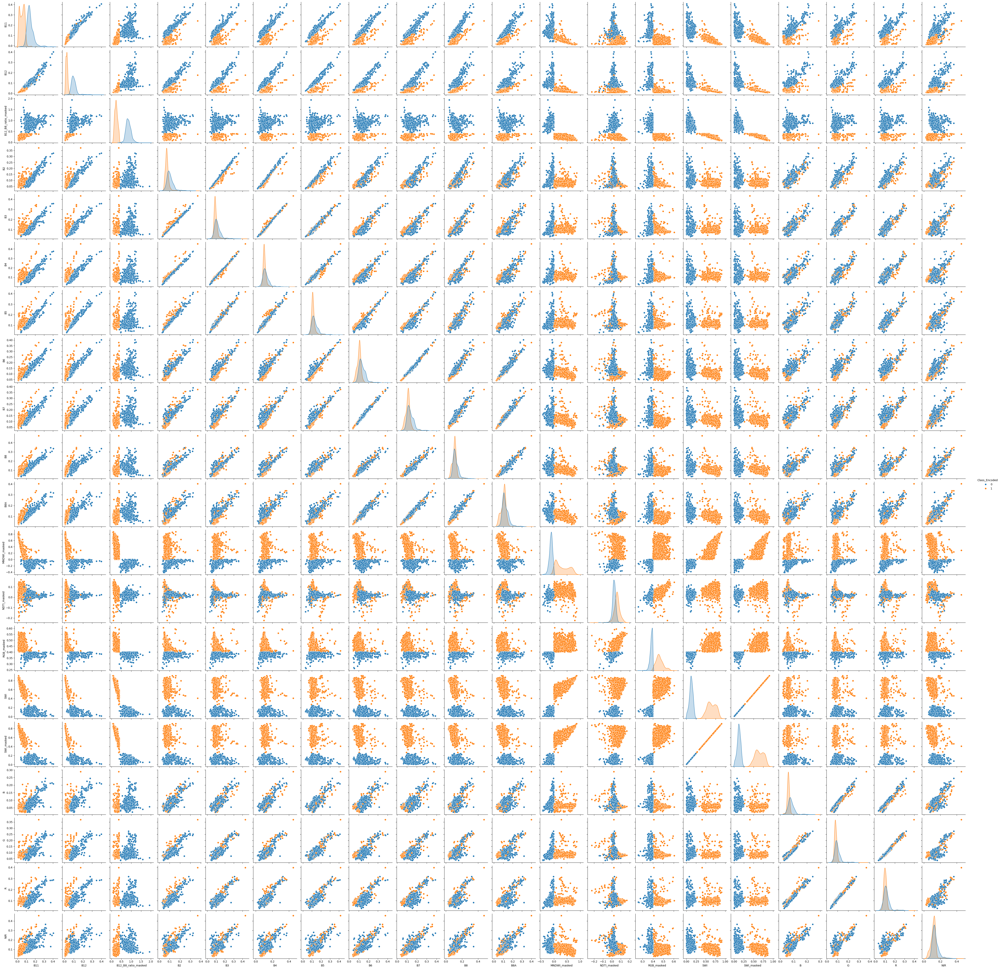

In [10]:
import seaborn as sns
sns.pairplot(df, hue='Class_Encoded')

# Save the plot as a PNG file
plt.savefig('pairplot.png', dpi=300)

##distinct colours = easier classification
##overlap = struggle to separate them
##highly correlated means might not share new info
##look at the histograms, don't want too much overlap

correlation matrix.csv
correlation matrix heatmap.png


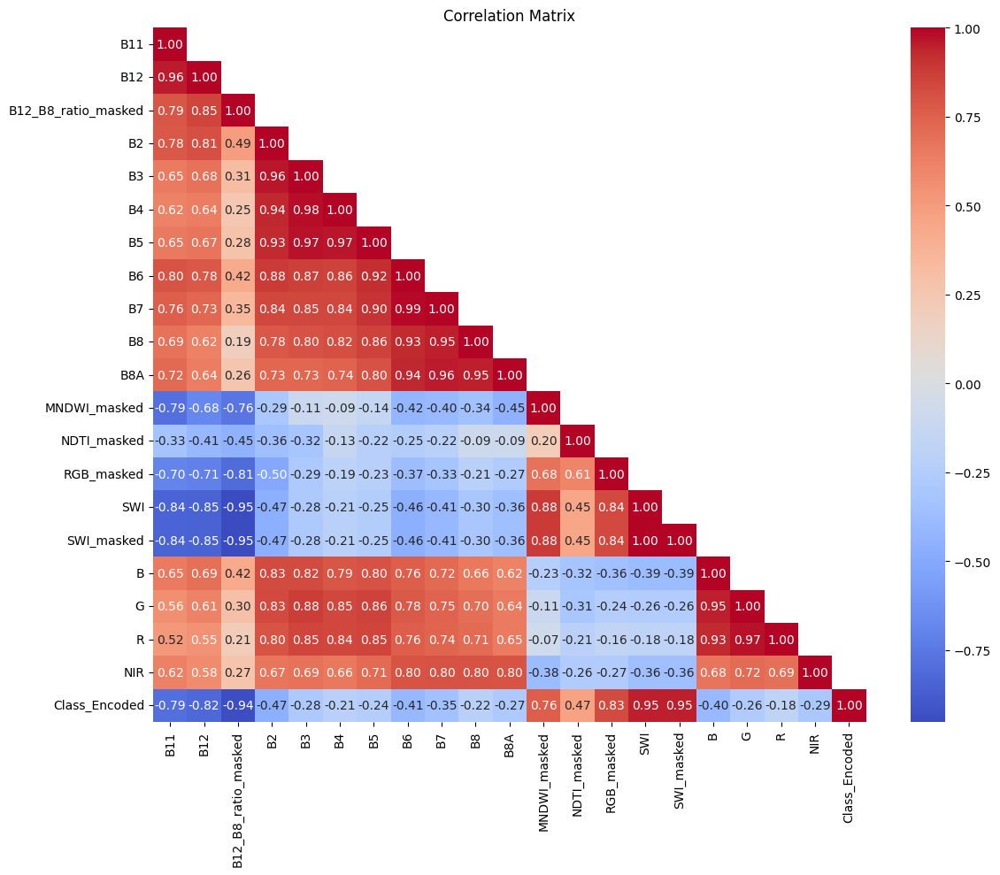

In [11]:
numerical_df = df.select_dtypes(include=['number'])         #Select only numerical features
corr_matrix = numerical_df.corr()                           #Compute the correlation matrix
mask = np.triu(np.ones_like(corr_matrix, dtype=bool), k=1)  #k=1 keeps the diagonal, # Create a mask for the upper triangle


corr_matrix_lower = corr_matrix.mask(mask)                  #Export
corr_matrix_lower.to_csv("correlation_matrix.csv", index=True)
print("correlation matrix.csv")

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix_lower, annot=True, cmap='coolwarm', fmt=".2f", mask=mask)
plt.title("Correlation Matrix")
plt.tight_layout()
plt.savefig("correlation_matrix_lower.png")             ## Save the heatmap as a PNG image
print("correlation matrix heatmap.png")
plt.show()


In [12]:
##drop features not giving relevant info, and SWI because redudant
df = df.drop(columns=['B2', 'B3', 'B4', 'B5','B6', 'B7', 'B8', 'B8A', 'SWI', 'G', 'R', 'NIR' ])
df.head()

,Description,B11,B12,B12_B8_ratio_masked,MNDWI_masked,NDTI_masked,RGB_masked,SWI_masked,B,Class_Encoded
0,pond,0.0213,0.0147,0.2487,0.664303,-0.008596,0.484054,0.756622,0.0633,1
1,pond,0.0318,0.0216,0.2971,0.429596,0.016656,0.476993,0.627907,0.0555,1
2,pond,0.0233,0.0168,0.2654,0.653016,0.008043,0.492000,0.727494,0.0687,1
3,pond,0.0289,0.0189,0.2398,0.560456,0.039326,0.488502,0.718750,0.0674,1
4,pond,0.0215,0.0145,0.2294,0.676448,0.004468,0.479180,0.783096,0.0683,1


In [13]:
X = X.reset_index(drop=True)
y = y.reset_index(drop=True)

X = X.drop_duplicates().reset_index(drop=True)
y = y.loc[X.index]  # Ensure target labels stay aligned

#splitt
X_train, X_test, y_train, y_test = train_test_split (X, y,           #input features (X) and target (y)
                                        test_size=0.2,               #80% data fr training,
                                        random_state=seed_value,     #ensures same split for reproduciliblity
                                        stratify=y)                  #if y is imbalanced, ensures balanced class distributions (useful for classification prbs)

##normalise features
scaler = MinMaxScaler()                                               #best for nn
X_normalised = scaler.fit_transform(X)
# Convert X_normalised back to DataFrame with original indices
X_normalised = pd.DataFrame(X_normalised, index=X.index, columns=X.columns)

In [17]:
# Retain the original indices
X_train_indices = X_train.index
X_test_indices = X_test.index

# Normalize features AFTER splitting
scaler = MinMaxScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), index=X_train_indices, columns=X.columns)
X_test = pd.DataFrame(scaler.transform(X_test), index=X_test_indices, columns=X.columns)

In [18]:
# 🔍 **Check for overlapping indices**
print(set(X_train.index) & set(X_test.index))  # Should be an empty set


set()


In [19]:
# Check class distribution
print(y_train.value_counts(normalize=True))
print(y_test.value_counts(normalize=True))

Class_Encoded
1    0.519071
0    0.480929
Name: proportion, dtype: float64
Class_Encoded
1    0.52014
0    0.47986
Name: proportion, dtype: float64


In [20]:
print('X_train:',np.shape(X_train))
print('y_train:',np.shape(y_train))
print('X_test:',np.shape(X_test))
print('y_test:',np.shape(y_test))


X_train: (2281, 20)
y_train: (2281,)
X_test: (571, 20)
y_test: (571,)


In [21]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)


In [22]:
# Define focal loss function
#def focal_loss(gamma=2., alpha=0.25):
    #def focal_loss_fixed(y_true, y_pred):
        # Clip values to prevent log(0) errors
        #y_pred = K.clip(y_pred, K.epsilon(), 1 - K.epsilon())
        # Cross entropy loss
        #cross_entropy = -y_true * K.log(y_pred) - (1 - y_true) * K.log(1 - y_pred)
        # Focal loss formula
        #loss = alpha * K.pow(1 - y_pred, gamma) * cross_entropy
        #return K.sum(loss, axis=-1)
    #return focal_loss_fixed

def focal_loss(gamma=2., alpha=.25):
    def focal_loss_fixed(y_true, y_pred):
        pt_1 = tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
        pt_0 = tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))
        return -K.sum(alpha * K.pow(1. - pt_1, gamma) * K.log(pt_1)) - K.sum((1-alpha) * K.pow( pt_0, gamma) * K.log(1. - pt_0))
    return focal_loss_fixed

# IoU metric
def iou_metric(y_true, y_pred):
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    y_true = tf.cast(y_true, tf.float32) # Cast y_true to float32
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    return intersection / (union + K.epsilon())

# MCC metric
def mcc_metric(y_true, y_pred):
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    y_true = tf.cast(y_true, tf.float32)  # Cast y_true to float32 to match y_pred
    tp = K.sum(y_true * y_pred)
    tn = K.sum((1 - y_true) * (1 - y_pred))
    fp = K.sum((1 - y_true) * y_pred)
    fn = K.sum(y_true * (1 - y_pred))
    numerator = (tp * tn - fp * fn)
    denominator = K.sqrt((tp + fp) * (tp + fn) * (tn + fp) * (tn + fn) + K.epsilon())
    return numerator / (denominator + K.epsilon())

# Create the model using hybrid loss (BCE + Focal Loss)
def create_model(input_shape):
    model = tf.keras.Sequential([
        Input(shape=(input_shape,)),

        Dense(512, kernel_regularizer=l2(0.01)),
        LeakyReLU(negative_slope=0.01),
        BatchNormalization(),
        Dropout(0.3),

        Dense(256),
        LeakyReLU(negative_slope=0.01),
        BatchNormalization(),
        Dropout(0.2),

        Dense(8),
        LeakyReLU(negative_slope=0.01),                  # Leaky ReLU with alpha=0.01
        BatchNormalization(),
        Dropout(0.2),

        Dense(1, activation='sigmoid')                   # Binary classification
    ])

    #initial_learning_rate = 1e-3
    #lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        #initial_learning_rate,
        #decay_steps=1000,
        #decay_rate=0.96,
        #staircase=True)


   # Define the Adam optimizer
    adam_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)   #how fast the model learns, default value as it is takes its time


    # Hybrid loss function (BCE + Focal Loss)
    def hybrid_loss(y_true, y_pred):
        return 0.5 * K.binary_crossentropy(y_true, y_pred) + 0.5 * focal_loss(gamma=2., alpha=.25)(y_true, y_pred)

    model.compile(optimizer=adam_optimizer,
                  #loss=hybrid_loss,   # Use the hybrid loss
                  loss='binary_crossentropy',
                  metrics=['accuracy',
                           tf.keras.metrics.Precision(name='precision'),
                           tf.keras.metrics.Recall(name='recall'),
                           iou_metric, # Use tf.keras.metrics.IoU instead of tf.keras.metrics.iou_metric
                           mcc_metric])

    return model

# Create model with input shape
#model = create_model(X_train.shape[1])


In [23]:
kf = KFold(n_splits=10, shuffle=True, random_state=3)  # 5-fold cross-validation

for train_index, val_index in kf.split(X):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]  # Use iloc to select rows by index
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]  # Use iloc to select rows by index

# Create model with input shape
model = create_model(X_train.shape[1])
print(model.summary())

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 512)                 │          10,752 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 8)                   │           2,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 8)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 8)                   │              32 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 8)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 147,249 (575.19 KB)

 Trainable params: 145,697 (569.13 KB)

 Non-trainable params: 1,552 (6.06 KB)

None


In [24]:
# Calculate class weights
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights = dict(enumerate(class_weights)) # Convert to dictionary

## Train the model
early_stopping = EarlyStopping(monitor=              #early stopping to prevent OF
                        'val_loss',                  #monitor and stopp training if val_loss doesnt improve..
                         patience=5,                 #..based on number of epochs/patience
                         restore_best_weights=True)  #restores model weights based og lowest val_loss if training stops

reduce_lr = ReduceLROnPlateau(monitor=
                        'val_loss',
                        factor=0.5,
                        patience=5,
                        min_lr=1e-6)

# Reset indices before training
X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
X_val = X_val.reset_index(drop=True)
y_val = y_val.reset_index(drop=True)

history = model.fit(X_train, y_train, # Changed y_train_ to y_train
                    validation_data=(X_val, y_val),
                    epochs=100,
                    batch_size=32,
                    class_weight=class_weights,
                    #validation_split=0.2,
                    callbacks=[early_stopping, reduce_lr],
                    verbose=2,                      #displays on console
                    shuffle=True)

# Optimized prediction function
@tf.function(reduce_retracing=True)
def optimized_predict(model, x):
    return model(x, training=False)

Epoch 1/100
81/81 - 16s - 196ms/step - accuracy: 0.9965 - iou_metric: 0.9944 - loss: 0.3427 - mcc_metric: 0.9927 - precision: 0.9985 - recall: 0.9947 - val_accuracy: 0.9193 - val_iou_metric: 0.8477 - val_loss: 0.6081 - val_mcc_metric: 0.8411 - val_precision: 0.8686 - val_recall: 1.0000 - learning_rate: 0.0010
Epoch 2/100
81/81 - 1s - 15ms/step - accuracy: 0.9996 - iou_metric: 0.9995 - loss: 0.1166 - mcc_metric: 0.9991 - precision: 1.0000 - recall: 0.9992 - val_accuracy: 0.9018 - val_iou_metric: 0.8251 - val_loss: 0.4769 - val_mcc_metric: 0.8156 - val_precision: 0.8444 - val_recall: 1.0000 - learning_rate: 0.0010
Epoch 3/100
81/81 - 0s - 4ms/step - accuracy: 0.9996 - iou_metric: 0.9995 - loss: 0.0595 - mcc_metric: 0.9991 - precision: 1.0000 - recall: 0.9992 - val_accuracy: 0.9053 - val_iou_metric: 0.8272 - val_loss: 0.3659 - val_mcc_metric: 0.8201 - val_precision: 0.8492 - val_recall: 1.0000 - learning_rate: 0.0010
Epoch 4/100
81/81 - 0s - 5ms/step - accuracy: 0.9969 - iou_metric: 0.994

In [25]:
# Convert test data to TensorFlow dataset
batch_size = 32
test_dataset = tf.data.Dataset.from_tensor_slices(X_test).batch(batch_size)

# Make Predictions
y_pred_prob = model.predict(X_test)  # Get probabilities
y_pred = (y_pred_prob > 0.2).astype(int)  # Convert to binary labels

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step


In [26]:
# Classification Report
print("Classification Report:\n", classification_report(y_test, y_pred))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm)


Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.79      0.88       274
           1       0.84      1.00      0.91       297

    accuracy                           0.90       571
   macro avg       0.92      0.89      0.90       571
weighted avg       0.92      0.90      0.90       571

Confusion Matrix:
 [[216  58]
 [  0 297]]


Accuracy: 0.90


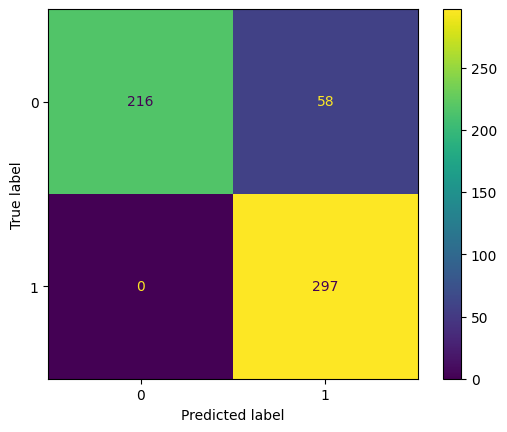

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.79      0.88       274
           1       0.84      1.00      0.91       297

    accuracy                           0.90       571
   macro avg       0.92      0.89      0.90       571
weighted avg       0.92      0.90      0.90       571



In [27]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay  # Import ConfusionMatrixDisplay
accuracy = accuracy_score(y_test, y_pred)  # Change y to y_test
print(f"Accuracy: {accuracy:.2f}")

cm = ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred))  # Change y to y_test
cm.plot()
plt.show()

report = classification_report(y_test, y_pred)  # Change y to y_test
print("Classification Report:")
print(report)



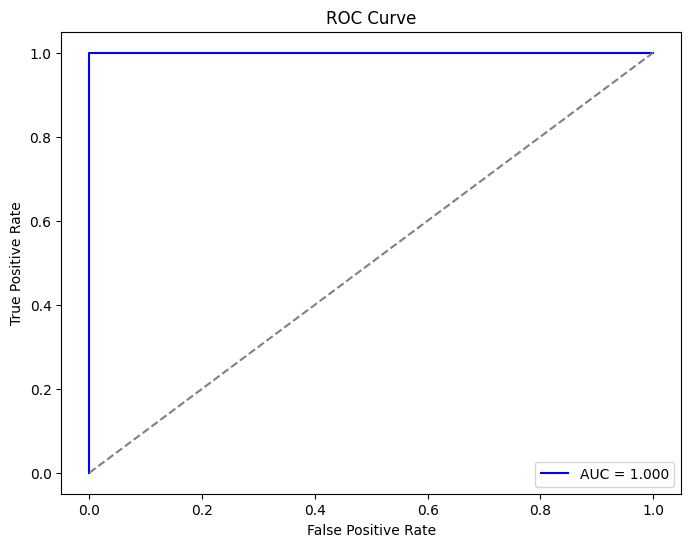

In [28]:
# Compute ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.3f}", color='blue')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')  # Diagonal reference line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

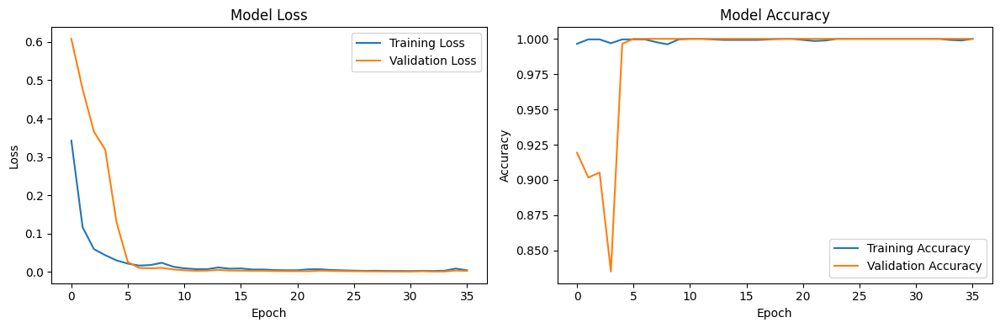

In [29]:
## Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

PermutationExplainer explainer: 572it [01:37,  5.37it/s]


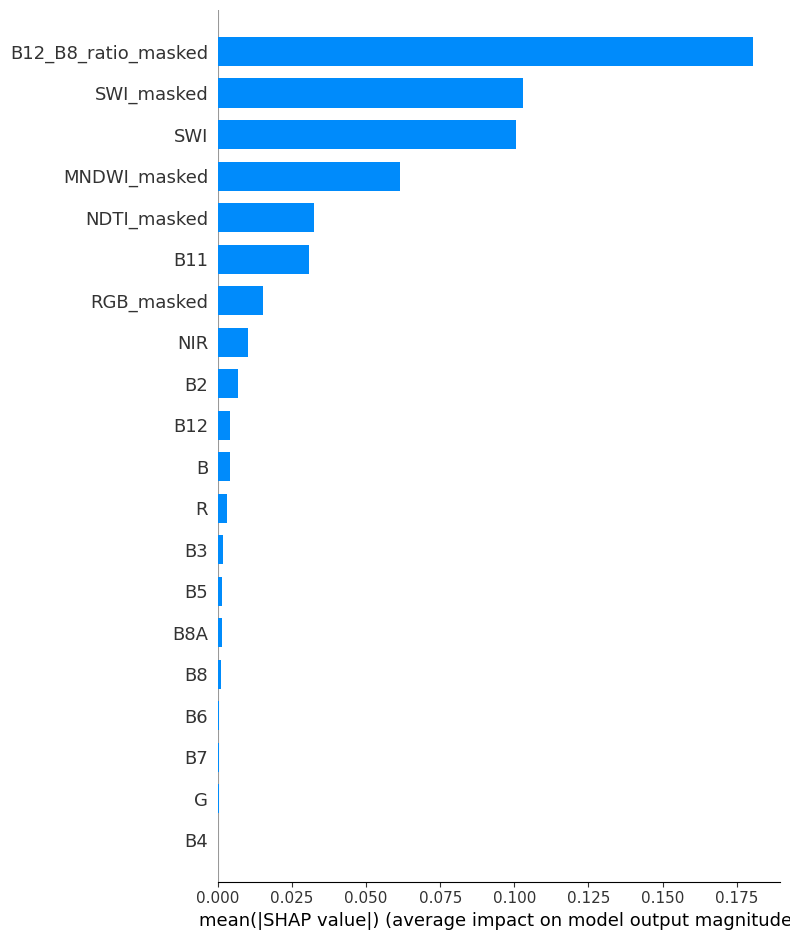

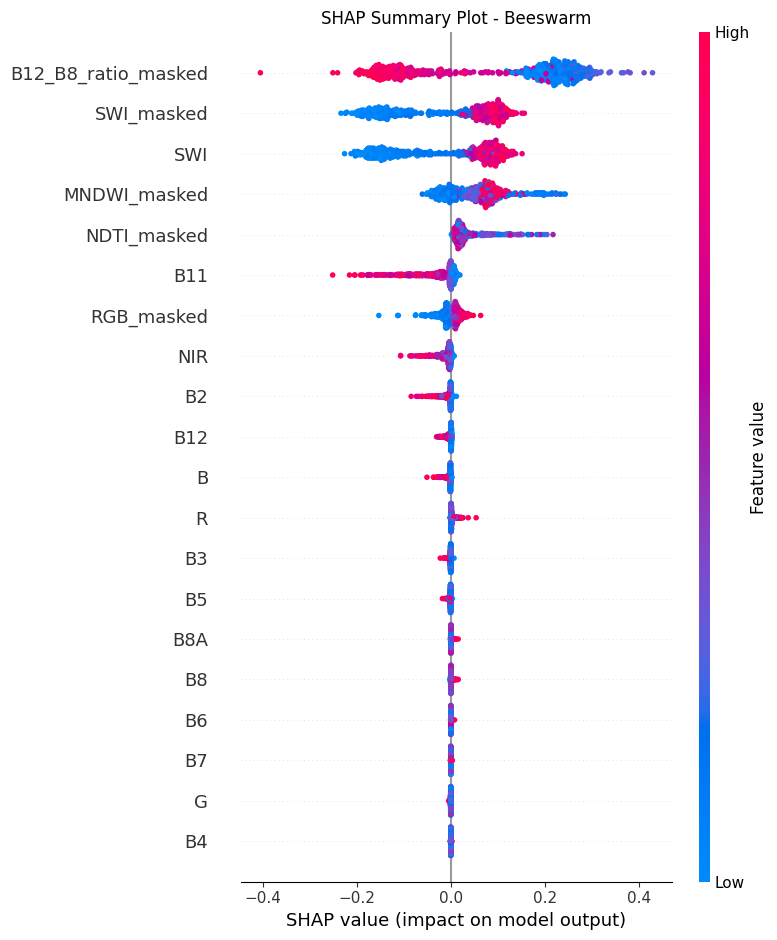

<Figure size 640x480 with 0 Axes>

In [31]:
import shap

# Explain the model using SHAP
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Plot feature importance
shap.summary_plot(shap_values, X_test, plot_type="bar")
plt.show()
plt.savefig("SHAP_summary_plot.png")

# Second Graph
plt.title("SHAP Summary Plot - Beeswarm")
shap.summary_plot(shap_values, X_test)
plt.show()
plt.savefig("SHAP_summary_Beeswarm.png")

In [32]:
print("Training class distribution:", np.bincount(y_train))
print("Validation class distribution:", np.bincount(y_test))


Training class distribution: [1238 1329]
Validation class distribution: [274 297]


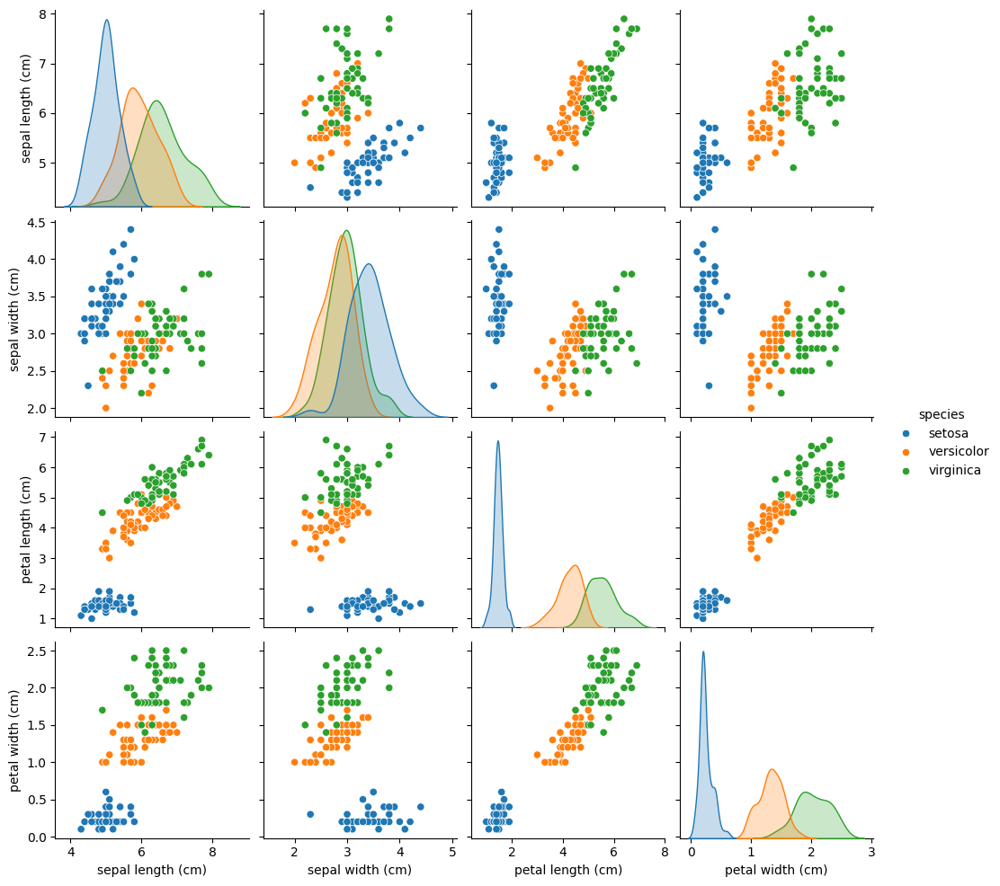

In [33]:
##example of what is it suppose to loook like
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
import pandas as pd # Import the pandas module

# Load iris dataset
iris = load_iris()
df = pd.DataFrame(data=iris.data, columns=iris.feature_names)
df['species'] = iris.target_names[iris.target]

# Create pairplot
sns.pairplot(df, hue='species')
plt.show()